# Diva 04 TOX-RUNX3 OE Epistasis

This notebook details flow cytometry analysis for Diva04.

## Initialize Environment

In [1]:
# Load Packages
library(fcexpr)
library(dplyr)
library(tidyr)
library(ggplot2)
library(ggpubr)
library(ggsci)
library(stringr)
library(jsonlite)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“package ‘jsonlite’ was built under R version 4.4.3”


In [2]:
# Set Working Directory
setwd("/home/dalbao/AlbaoRunx3Manuscript/flow/Fig06")

# Load flow processing functions
source("/home/dalbao/AlbaoRunx3Manuscript/flow/scripts/flowProcessing.R")

# Import sample codebook
codebook <- read.csv("Diva04-Samples.csv")

# Population schemas file
p.schemas <- "Diva05-PopulationSchemas.json"

# Design schemas file
d.schemas <- "Diva05-DesignSchemas.json"

# Output Folder
output_folder <- "Diva04"

# Load Workspace (or cached version if it exists)
workspace <- load_workspace_cached(
                wsp_file = "DSE4-D8P1-Dominic-260825.wsp",
                rds_file = "Diva04-Workspace.rds",
                overwrite = FALSE # Set to TRUE to reprocess WSP and overwrite cached workspace
        )

# Extract Counts and MFI
counts  <- workspace[["counts"]]
stats   <- workspace[["stats"]]


Attaching package: ‘rlang’


The following objects are masked from ‘package:jsonlite’:

    flatten, unbox



Attaching package: ‘rstatix’


The following object is masked from ‘package:stats’:

    filter



Attaching package: ‘purrr’


The following objects are masked from ‘package:rlang’:

    %@%, flatten, flatten_chr, flatten_dbl, flatten_int, flatten_lgl,
    flatten_raw, invoke, splice


The following object is masked from ‘package:jsonlite’:

    flatten




# Process Gating Data
Cleanup data to report only gates below CD8.

In [3]:
# Filter only samples in "Samples" FlowJoGroup
surface <- counts %>% filter((FlowJoGroup %in% c("Samples")))

# codebook contains a mapping of FileName metadata
# Join surface with codebook to get metadata
surface <- surface %>%
    left_join(  codebook,
                by = c("FileName" = "FileName"))

# Multiply FractionOfParent by 100 and rename to Percent
surface <- surface %>%
    mutate(FractionOfParent = FractionOfParent * 100) %>%
    rename(Percent = FractionOfParent)

head(surface)


,FileName,PopulationFullPath,Parent,Population,Count,ParentCount,Percent,xDim,yDim,eventsInside,FilePath,FlowJoGroup,ws,Group,Ametrine,GFP,TotalLymphocytes
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1,shCD19+MIGR1_1_B1_B01.fcs,root,NA,root,3751905,NA,NA,NA,NA,NA,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000
2,shCD19+MIGR1_1_B1_B01.fcs,Lymphocytes,root,Lymphocytes,2198624,3751905,58.60020,FSC-A,SSC-A,1,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000
3,shCD19+MIGR1_1_B1_B01.fcs,Lymphocytes/Single Cells,Lymphocytes,Lymphocytes/Single Cells,772744,2198624,35.14671,FSC-W,FSC-H,1,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000
4,shCD19+MIGR1_1_B1_B01.fcs,Lymphocytes/Single Cells/Single Cells,Lymphocytes/Single Cells,Single Cells/Single Cells,284687,772744,36.84105,SSC-W,SSC-H,1,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000
5,shCD19+MIGR1_1_B1_B01.fcs,Lymphocytes/Single Cells/Single Cells/CD8,Lymphocytes/Single Cells/Single Cells,CD8,209491,284687,73.58643,Comp-BB790-A,Comp-BUV 396-A,1,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000
6,shCD19+MIGR1_1_B1_B01.fcs,Lymphocytes/Single Cells/Single Cells/CD8/Transferred,Lymphocytes/Single Cells/Single Cells/CD8,Transferred,25456,209491,12.15136,Comp-BUV496-A,SSC-A,1,/D:/UF%20Dropbox/SCRPS-PipkinLab/Dominic%20Albao/Experiments/Diva%20Experiments/Exp4%20EpistasisID+shTox/Flow/D8P1/96%20Well%20-%20U%20bottom/shCD19+MIGR1_1_B1_B01.fcs,Samples,DSE4-D8P1-Dominic-260825.wsp,A,shCd19,mock,243950000


Process df:

In [4]:
# Keep only observations in surface wherin PopulationFullPath contains
# "Lymphocytes/Single Cells/Single Cells/"
surface <- surface %>%
    filter(grepl("Lymphocytes/Single Cells/Single Cells/", PopulationFullPath))

# Remove "Lymphocytes/Single Cells/Single Cells/" from PopulationFullPath
surface <- surface %>%
    mutate(PopulationFullPath = gsub("Lymphocytes/Single Cells/Single Cells/", "", PopulationFullPath))

# Select relevant columns
surface <- surface %>%
    # Rename FileName to ID, remove spaces
    mutate(ID = FileName) %>%
    select(ID, colnames(codebook), PopulationFullPath, TotalLymphocytes, Count, Percent, ) %>%
    select(-FileName)

Calculate total percent:

In [5]:
# First Compote Total Percent
total_percent <- compute_percent_of_total(surface) %>%
    mutate(PopulationString = PopulationFullPath)

# Make function relevel which "relevels" the total_percent dataframe
relevel_df <- function(df, base_level) {
    depth_subtract <- length(unlist(strsplit(base_level, "/")))
    df <- df %>%
        filter(grepl(paste0(base_level, "/"), PopulationFullPath)) %>%
        mutate(
            PopulationFullPath = gsub(paste0(base_level, "/"), "", PopulationFullPath),
            ParentPath = gsub(paste0(base_level), "", ParentPath),
            Depth = Depth - depth_subtract
        ) %>%
        # Remove "/" from ParentPath if it is first character
        mutate(ParentPath = gsub("^/", "", ParentPath))
    return(df)
}

# Keep only if PopulationFullPath contains "CD8/Transferred/"
total_percent <- relevel_df(total_percent, "CD8/Transferred")

# Extract transduction condition from PopulationFullPath and add as new column
total_percent$Transduction <- sapply(
    total_percent$PopulationFullPath,
    function(x) {
        split_path <- unlist(strsplit(x, "/"))
        return(split_path[1])
    }
)

# Remove ancillary columns and rename
total_percent <- total_percent %>%
    select(ID, Group, Ametrine, GFP, Transduction, PopulationString, PopulationFullPath, TotalLymphocytes, Count, Percent, PercentOfTotal, Depth) %>%
    rename(PercentOfLymphocytes = PercentOfTotal) %>%
    mutate(Percent = ifelse(Depth == 1, 100, Percent)) %>%
    select(-Depth) %>%
    mutate(PopulationFullPath = gsub("Double|OE|shRNA", "Transduced", PopulationFullPath))

# Split total_percent into a list of dataframes based on "Transduction" column, with the names of the list being the unique values of "Transduction"
total_percent <- split(total_percent, total_percent$Transduction) %>%
    lapply(compute_percent_of_total) %>%
    bind_rows() %>%
    rename(PercentOfTransduced = PercentOfTotal) %>%
    add_population_derivatives() %>%
    finalize_flow_table(round_digits = NULL) %>%
    select(-Population) %>%
    mutate(
        RealCount = TotalLymphocytes * PercentOfLymphocytes / 100,
        Population = ifelse(is.na(Population1Deriv), "all", Population1Deriv),
        Population1Deriv = Population2Deriv
    ) %>% select(-Population2Deriv)

head(total_percent, n = 10)

ID,Group,Population1Deriv,Ametrine,GFP,Transduction,PopulationString,TotalLymphocytes,Count,PercentOfLymphocytes,PercentOfTransduced,Percent,RealCount,Population
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,Double,CD8/Transferred/Double,243950000,6770,2.3780503,100.00000,100.00000,5801253.7,all
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,OE,CD8/Transferred/OE,243950000,5187,1.8220010,100.00000,100.00000,4444771.5,all
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,shRNA,CD8/Transferred/shRNA,243950000,2731,0.9592992,100.00000,100.00000,2340210.3,all
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,Double,CD8/Transferred/Double/CXCR6pos,243950000,4863,1.7081918,71.83161,71.83161,4167133.9,CXCR6pos
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,OE,CD8/Transferred/OE/CXCR6pos,243950000,3819,1.3414733,73.62637,73.62637,3272524.0,CXCR6pos
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,shRNA,CD8/Transferred/shRNA/CXCR6pos,243950000,2056,0.7221967,75.28378,75.28378,1761798.7,CXCR6pos
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,Double,CD8/Transferred/Double/Gerlach-Tcm,243950000,1439,0.5054674,21.25554,21.25554,1233087.7,Gerlach-Tcm
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,OE,CD8/Transferred/OE/Gerlach-Tcm,243950000,1251,0.4394300,24.11799,24.11799,1071989.4,Gerlach-Tcm
shCD19+MIGR1_1_B1_B01.fcs,A,NA,shCd19,mock,shRNA,CD8/Transferred/shRNA/Gerlach-Tcm,243950000,502,0.1763340,18.38155,18.38155,430166.8,Gerlach-Tcm


## Process MFI Data

In [6]:
mfi <- stats %>%
    # Keep only relevant columns in stats
    select(FileName, PopulationFullPath, channel, value) %>%
    # Relevel PopulationFullPath to "CD8"
    mutate(PopulationFullPath = gsub("Lymphocytes/Single Cells/Single Cells/", "", PopulationFullPath)) %>%
    # Rename channels
    mutate(channel = case_when(
        channel == "Comp-APC-A" ~ "mfi.TOX",
        channel == "Comp-APC-Cy7-A" ~ "mfi.PD1")
    ) %>%
    # Pivot wider to have one row per FileName and PopulationFullPath, with columns for each channel
    pivot_wider(names_from = channel, values_from = value)

head(mfi)

FileName,PopulationFullPath,mfi.TOX,mfi.PD1
<chr>,<chr>,<dbl>,<dbl>
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double,179.9517,200.7599
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double/CXCR6pos,188.7128,225.0287
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double/Gerlach-Tcm,194.2963,218.5237
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double/Gerlach-Tcm/CXCR6pos,202.3469,238.4437
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double/Gerlach-Tem,112.6680,161.3120
shTOX.2+Runx3DID_4_A4_A04.fcs,CD8/Transferred/Double/Gerlach-Tem/CXCR6pos,118.6700,190.4323


In [7]:
# Combine mfi (FileName, PopulationFullPath) to total_percent (ID, PopulationString)
all.data <- total_percent %>%
    left_join(mfi, by = c("ID" = "FileName", "PopulationString" = "PopulationFullPath")) %>%
    # Select columns
    select(
        ID, Group, Ametrine, GFP, Transduction,
        Population, Population1Deriv,
        Count, RealCount, PercentOfLymphocytes, PercentOfTransduced, Percent, mfi.TOX, mfi.PD1
    )

head(all.data, n = 20)

# Save all.data to CSV
if (!dir.exists(output_folder)) {
    dir.create(output_folder)
}
write.csv(all.data, file = paste0(output_folder, "/measured_data.csv"), row.names = FALSE, quote = FALSE)

ID,Group,Ametrine,GFP,Transduction,Population,Population1Deriv,Count,RealCount,PercentOfLymphocytes,PercentOfTransduced,Percent,mfi.TOX,mfi.PD1
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,Double,all,NA,6770,5801253.7,2.3780503,100.00000,100.00000,258.1826,376.4450
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,OE,all,NA,5187,4444771.5,1.8220010,100.00000,100.00000,288.9406,382.8647
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,shRNA,all,NA,2731,2340210.3,0.9592992,100.00000,100.00000,273.9359,387.5733
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,Double,CXCR6pos,NA,4863,4167133.9,1.7081918,71.83161,71.83161,285.7644,411.7164
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,OE,CXCR6pos,NA,3819,3272524.0,1.3414733,73.62637,73.62637,314.5493,428.2152
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,shRNA,CXCR6pos,NA,2056,1761798.7,0.7221967,75.28378,75.28378,306.2043,446.2172
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,Double,Gerlach-Tcm,NA,1439,1233087.7,0.5054674,21.25554,21.25554,374.2626,520.8605
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,OE,Gerlach-Tcm,NA,1251,1071989.4,0.4394300,24.11799,24.11799,431.0888,570.7286
shCD19+MIGR1_1_B1_B01.fcs,A,shCd19,mock,shRNA,Gerlach-Tcm,NA,502,430166.8,0.1763340,18.38155,18.38155,415.0005,601.4888


## Process Population and Design Schemas

In [8]:
# Load PopulationSchemas.json to check if grouped populations are defined as groups in the schema
p.schemas <- fromJSON(p.schemas)
p.schemas <- lapply(p.schemas, as.character)

p.schemas.names <- names(p.schemas)

# Inspect structure
p.schemas

$Pipkin
[1] "TcmE" "TcmL" "TE"   "Exh" 

$Gerlach
[1] "Tcm" "Tpm" "Tem"

$Kaech
[1] "TE" "DP" "MP" "EE"

In [9]:
# Load DesignSchemas.json
d.schemas <- fromJSON(d.schemas)
d.schemas <- lapply(d.schemas, as.character)

# Inspect structure
d.schemas

$Group
[1] "A" "B" "C" "D" "E"

In [10]:
# Define Transduction groups
transductions <- c("Double", "OE", "shRNA")

# Define stats comparison groups
comparison_groups <- list(
    c("A", "B"),
    c("B", "C"),
    c("A", "C"),
    c("A", "D"),
    c("D", "E"),
    c("C", "E"),
    c("B", "E")
)

In [11]:
# Show Groups for reference
ordered(unique(paste(all.data$Group, all.data$Ametrine, all.data$GFP)))

[1] A shCd19 mock C shCd19 dID  B shCd19 WT   D shTox mock  E shTox dID  
5 Levels: A shCd19 mock < B shCd19 WT < C shCd19 dID < ... < E shTox dID

## Plot

In [12]:
# Use theme_bw, base 12, not bold, and remove legend
theme <- theme_bw(
    base_size = 14,
    base_family = "sans"
) +
    theme(
        axis.text = element_text(size = 14, color = "black"),
        axis.title = element_text(size = 14, color = "black"),
        axis.text.x = element_text(size = 12, angle = 0, color = "black"),
        axis.text.y = element_text(size = 12, color = "black"),
        axis.title.x = element_blank(),

        # Remove facet strip background + box
        strip.background = element_rect(fill = NA, color = NA),
        strip.text = element_text(color = "black"),  # optional: keep text styling clean

        legend.position = "none",
        plot.title = element_text(size = 12),
        panel.grid = element_blank()
    )

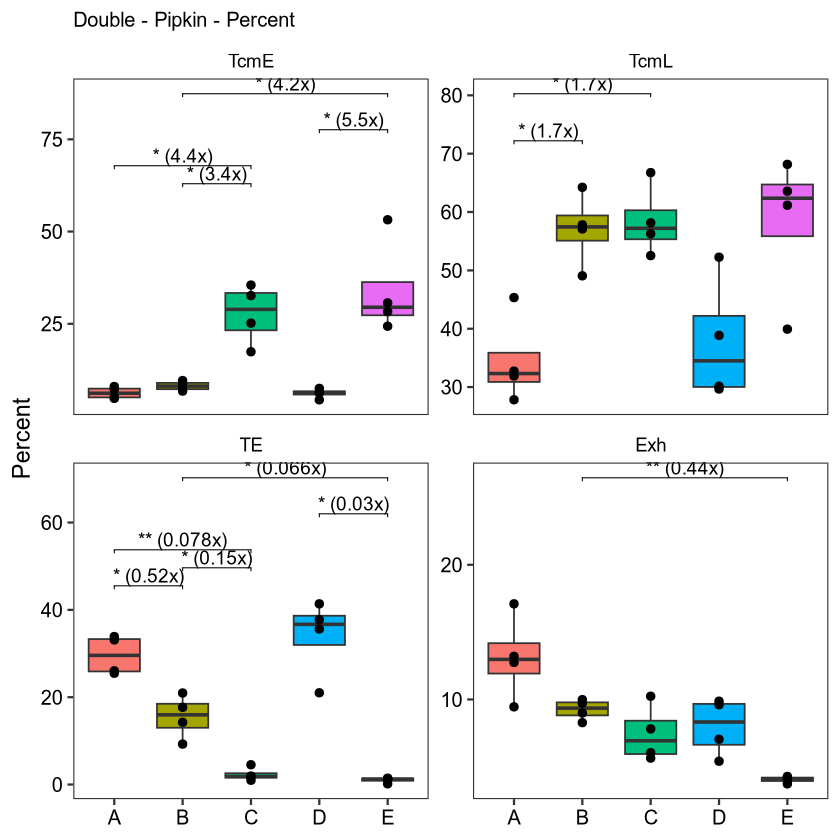

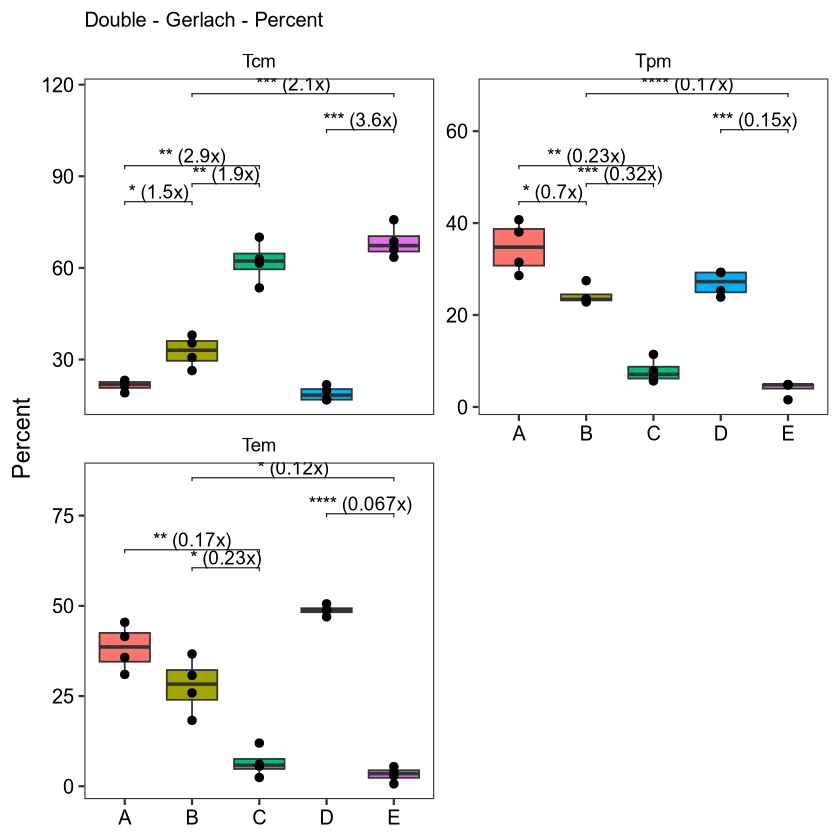

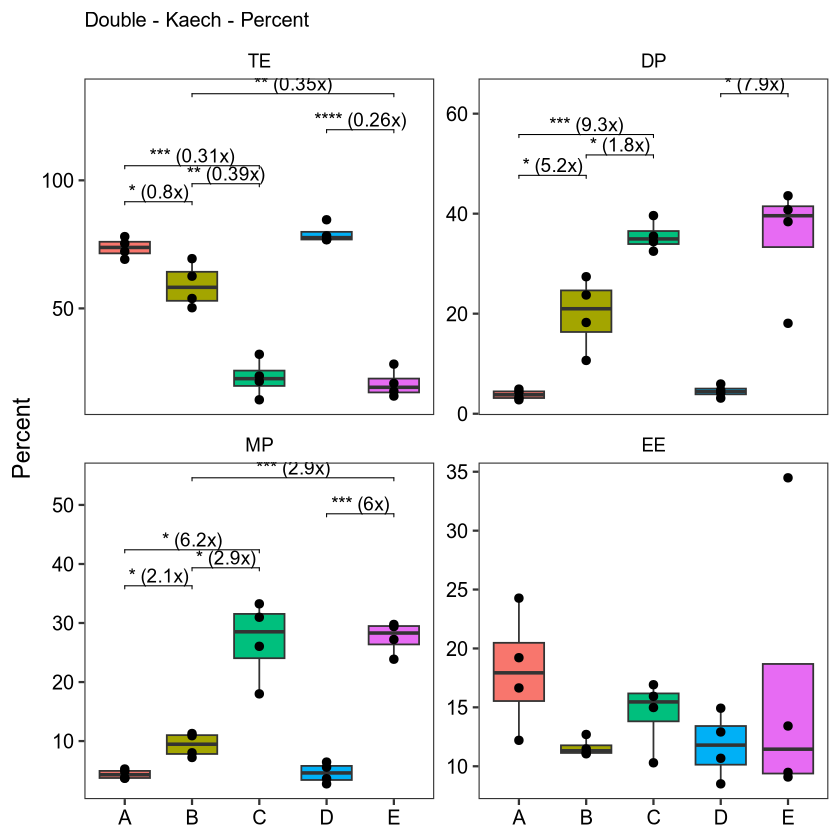

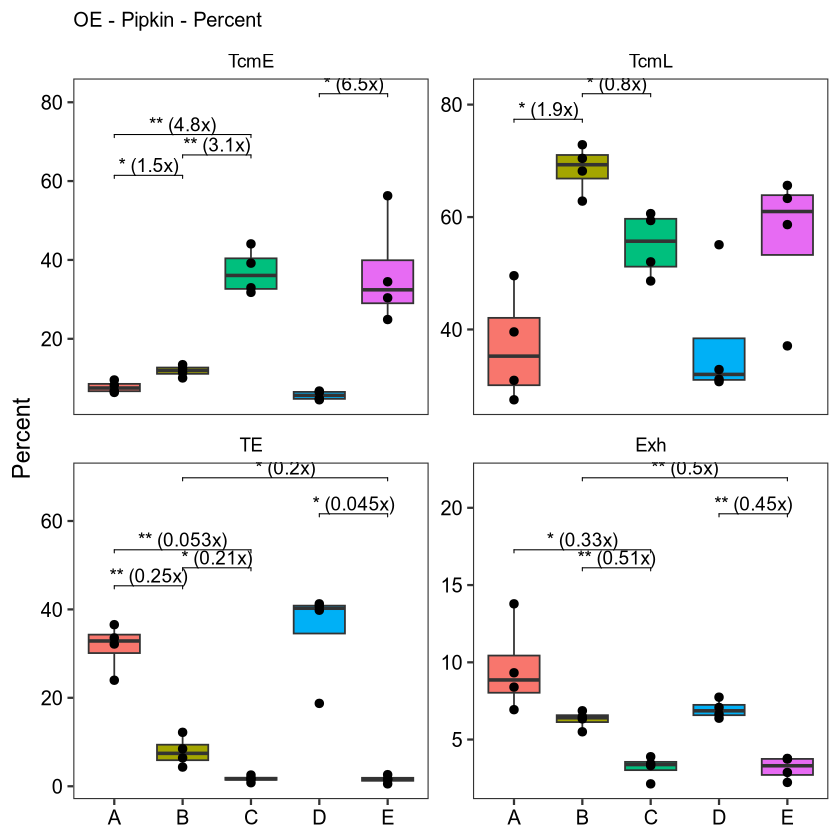

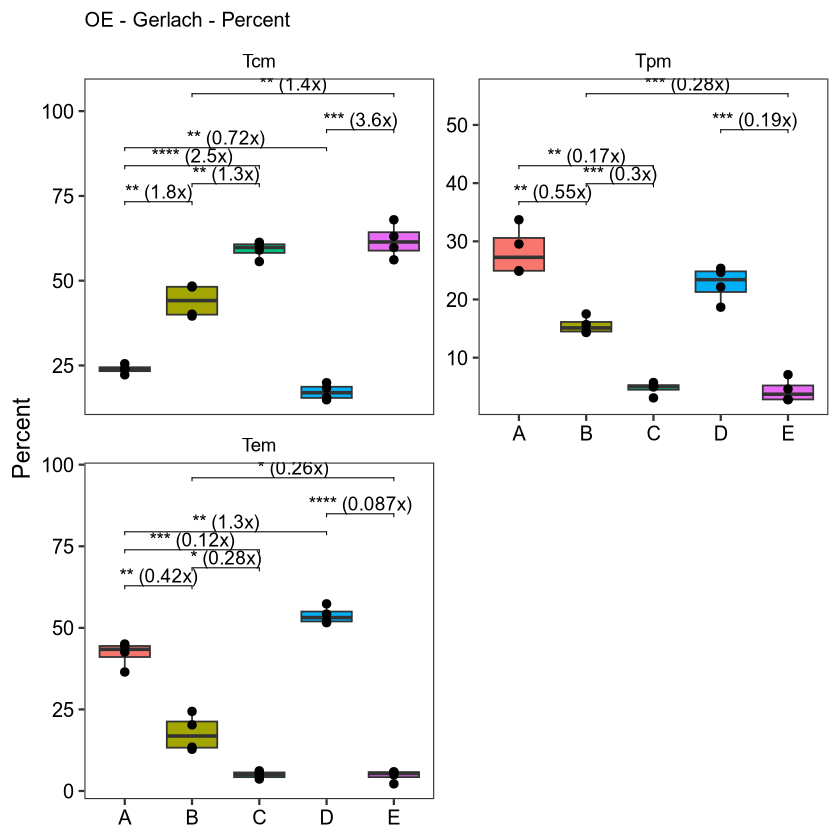

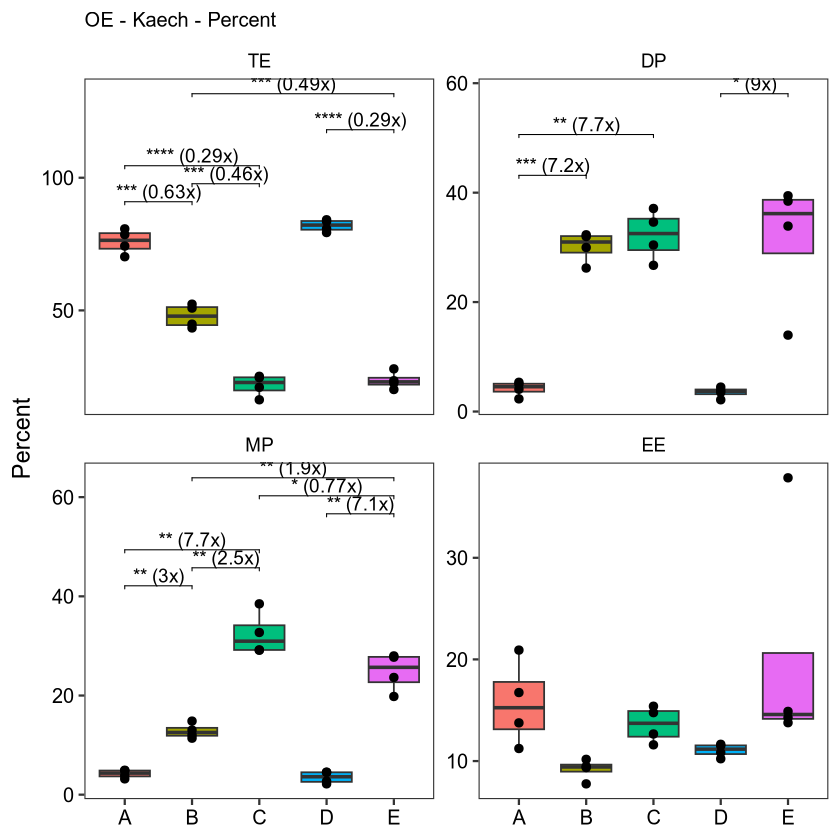

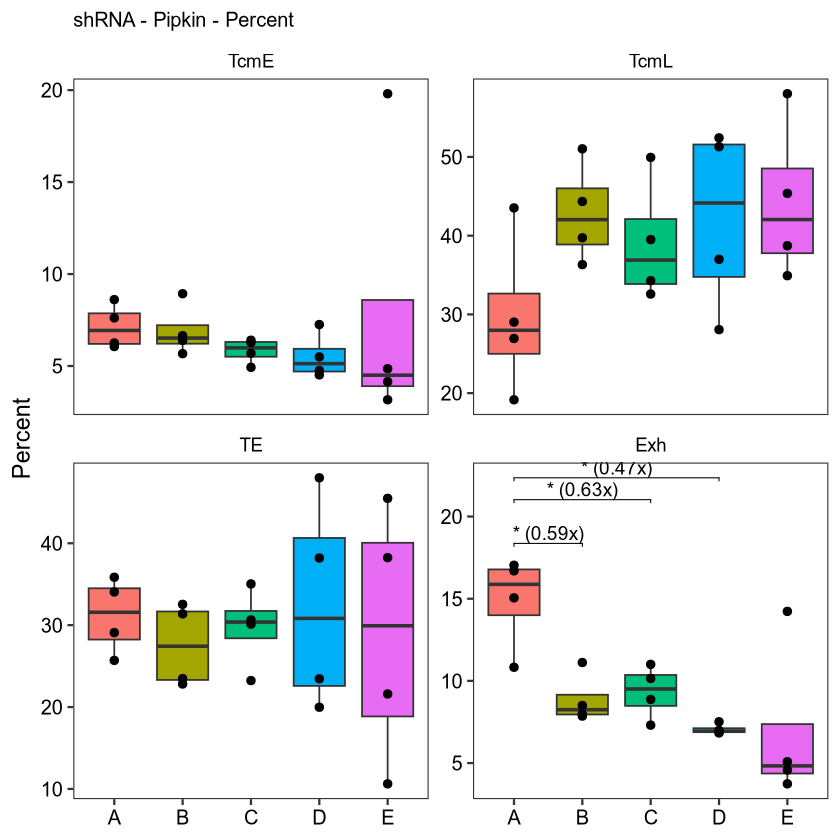

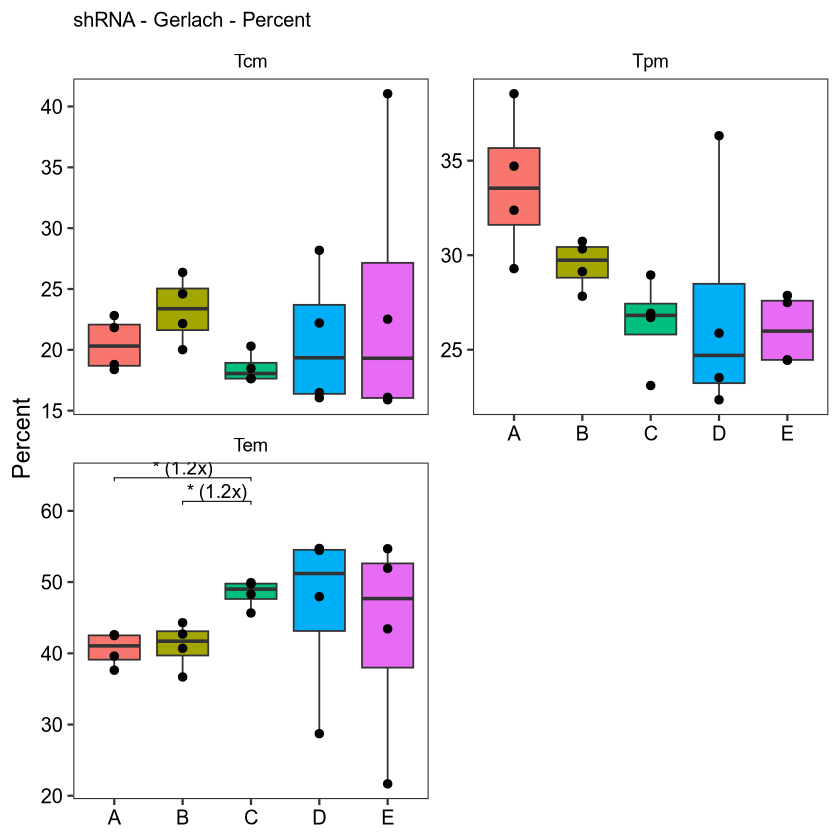

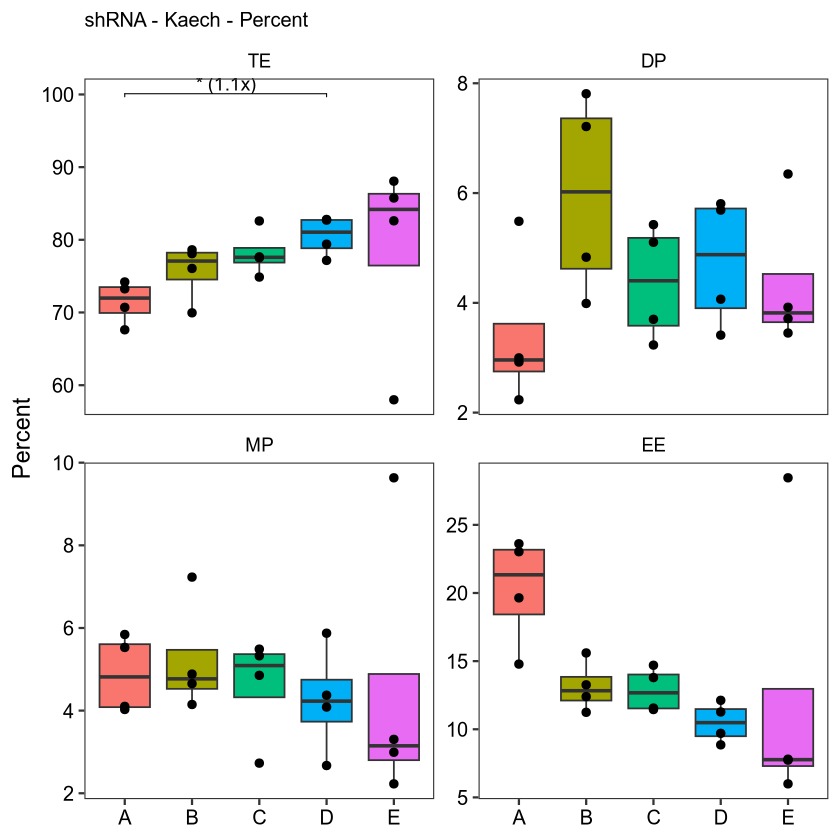

In [13]:
plotOnLoopPopulation <- function(transductions, p.schemas, y_axis, output_tag) {
    p.schemas.names <- names(p.schemas)

    # Loop on all transduction groups
    for(trans in transductions) {

        # Loop on all schemas on the Population level    
        for(schema in p.schemas.names) {

            # Select only Population with "Schema-" schema with no Population1Deriv
            # Keep only trans
            plot.data.df <- all.data %>%
                mutate(
                    Population = ifelse(Population == "all", "all-all",
                        ifelse(Population == "CXCR6pos", "CXCR6-CXCR6pos",
                            Population
                        )
                    )
                ) %>%
                filter(
                    Transduction == trans,
                    is.na(Population1Deriv),
                    grepl(paste0(schema, "-"), Population)
                ) %>%
                mutate(
                    Population = factor( 
                        gsub(paste0(schema, "-"), "", Population),
                        levels = p.schemas[[schema]]
                    ),
                    Group = factor(Group, levels = d.schemas[["Group"]])
                )
            
            # Calculate p-values and adjusted p-values for comparisons using plot_padj function
            plot.stat.df <- plot_padj(
                data = plot.data.df,
                comparisons = comparison_groups,
                y_col = y_axis,
                x_col = "Group",
                facet_col = "Population",
                step_fraction = 0.1,
                min_step = 0.5
            )
            # Save plot.stat.df to a CSV file for inspection
            write.csv(plot.stat.df, paste0(
                output_folder,
                "/stats-",
                trans, "-", schema, "-", output_tag,
                ".csv"))

            # Round plot.stat.df column foldmean to one significant digit
            # Then concatenate to p.adj.signif only if not "ns", into column p.adj.fold
            plot.stat.df <- plot.stat.df %>%
                mutate(foldmeanround = signif(foldmean, digits = 2)) %>%
                mutate(p.adj.fold = ifelse(p.adj.signif == "ns", "ns", paste0(p.adj.signif, " (", foldmeanround, "x)")))

            p <- ggplot(plot.data.df, aes(x = Group, y = .data[[y_axis]], fill = Group)) +
                geom_boxplot(outlier.shape = NA) +
                geom_point(size = 2) +
                facet_wrap(~Population, ncol = 2, scales = "free_y") +
                theme +
                stat_pvalue_manual(
                    plot.stat.df %>% filter(p.adj < 0.05),
                    label = "p.adj.fold",   # adjusted p-value stars
                    tip.length = 0.01,
                    size = 4,
                    inherit.aes = FALSE       # important fix
                ) + ggtitle(paste0(trans, " - ", schema, " - ", y_axis))

            print(p)

            ggsave(
                filename = paste0(
                    output_folder,
                    "/plots-",
                    trans, "-", schema, "-", output_tag,
                    ".pdf"),
                plot = p,
                width = 10,
                height = 10,
                units = "in"
            )

        }

    }

}

plotOnLoopPopulation(transductions, p.schemas, y_axis = "Percent", output_tag = "percentOFparents")

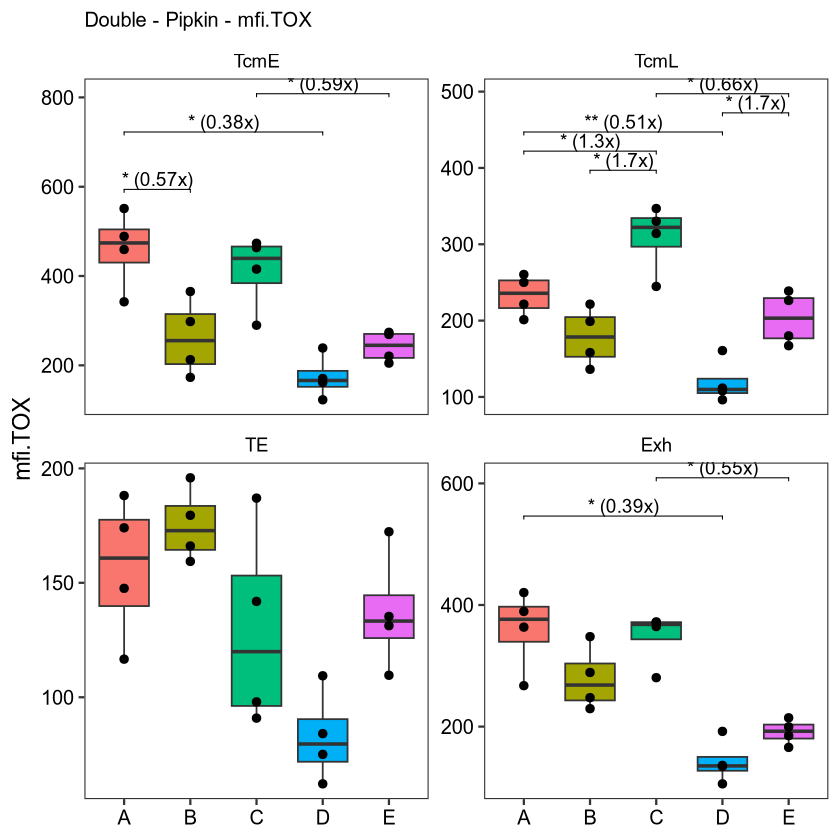

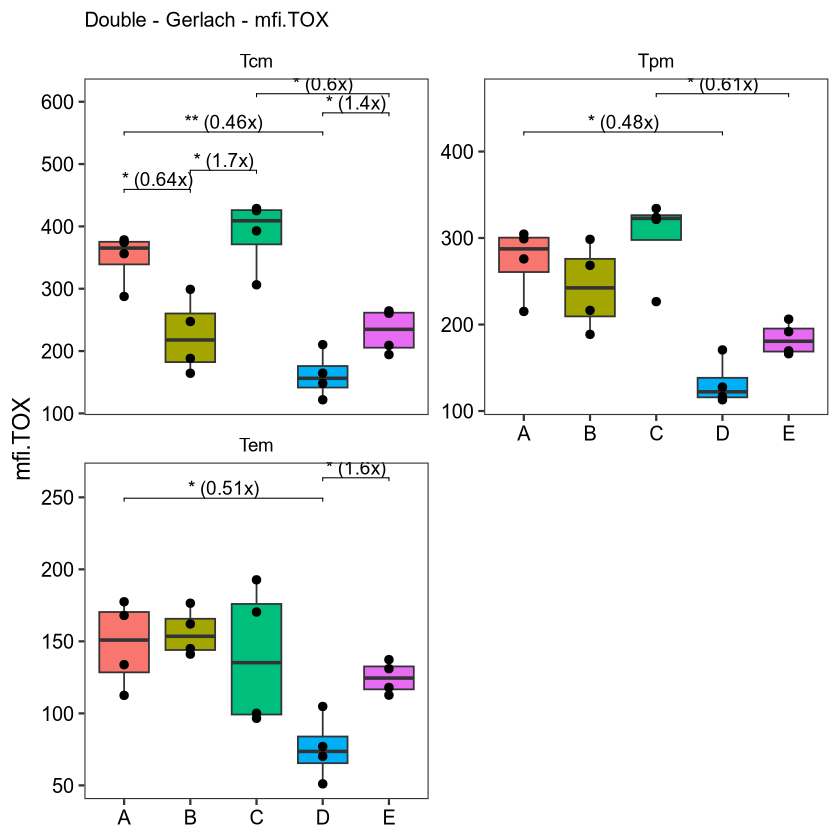

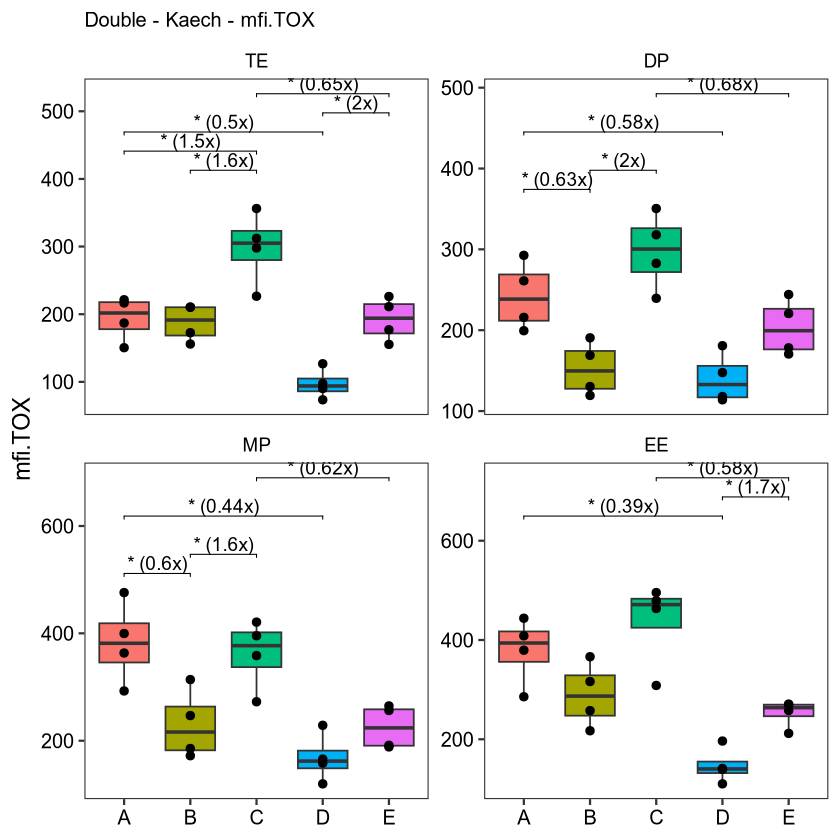

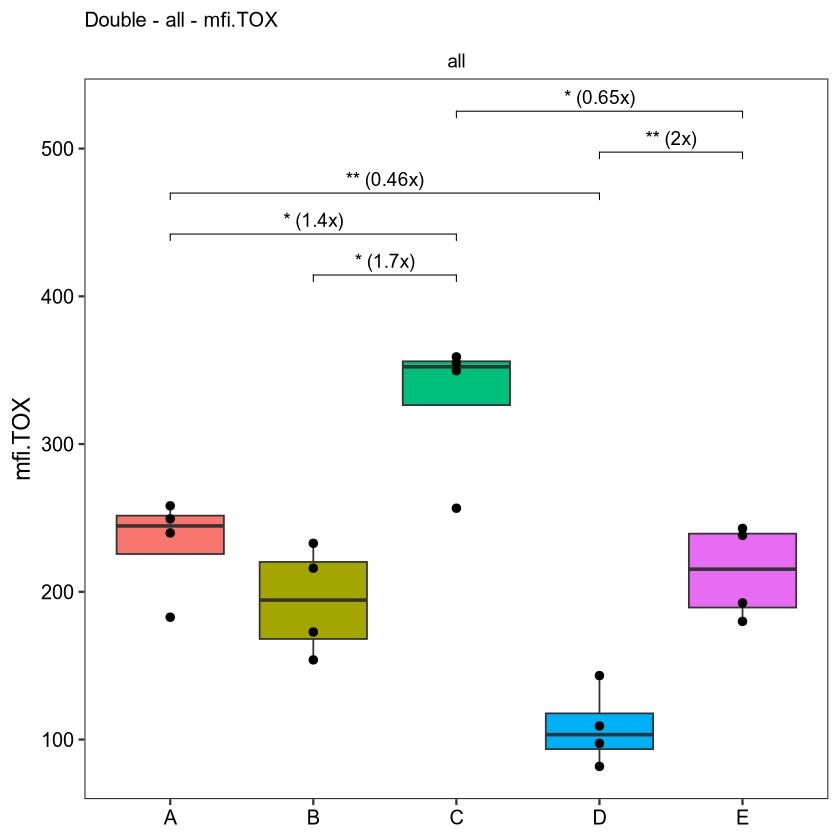

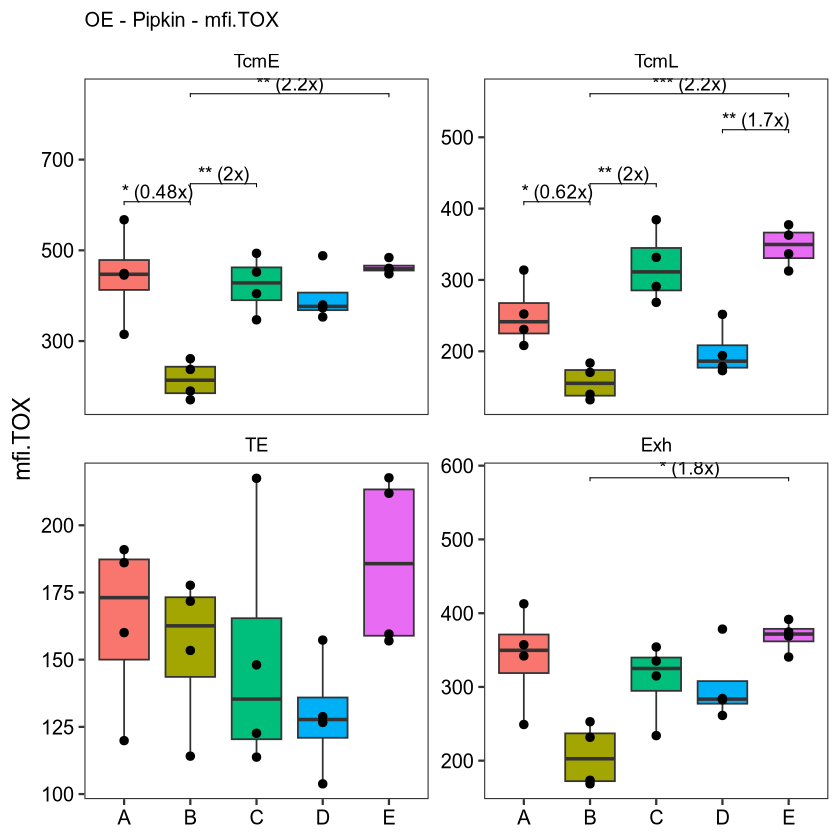

...

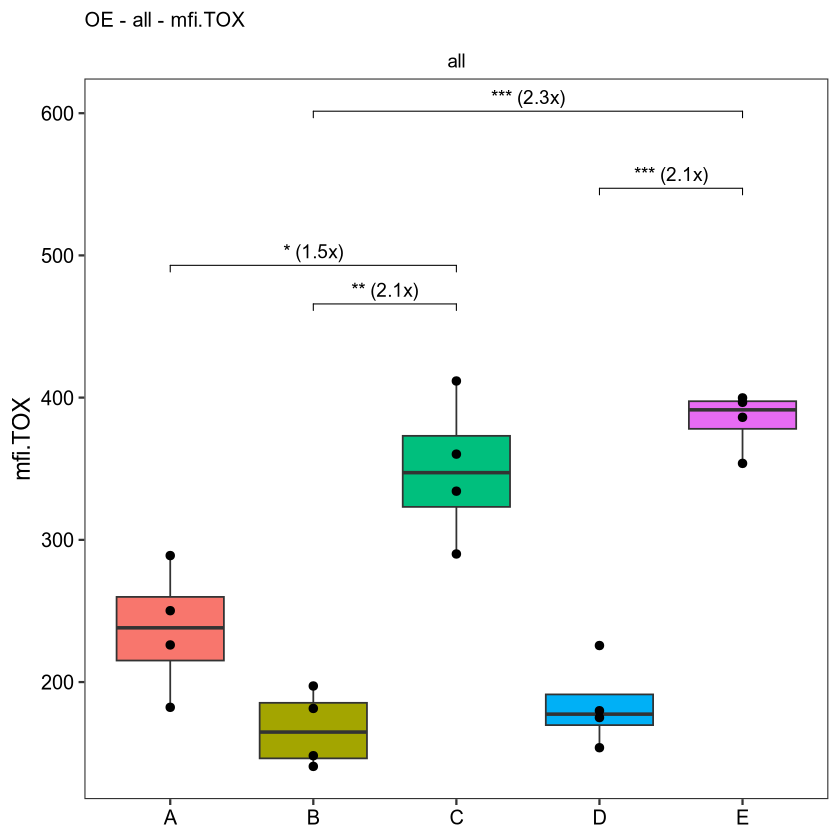

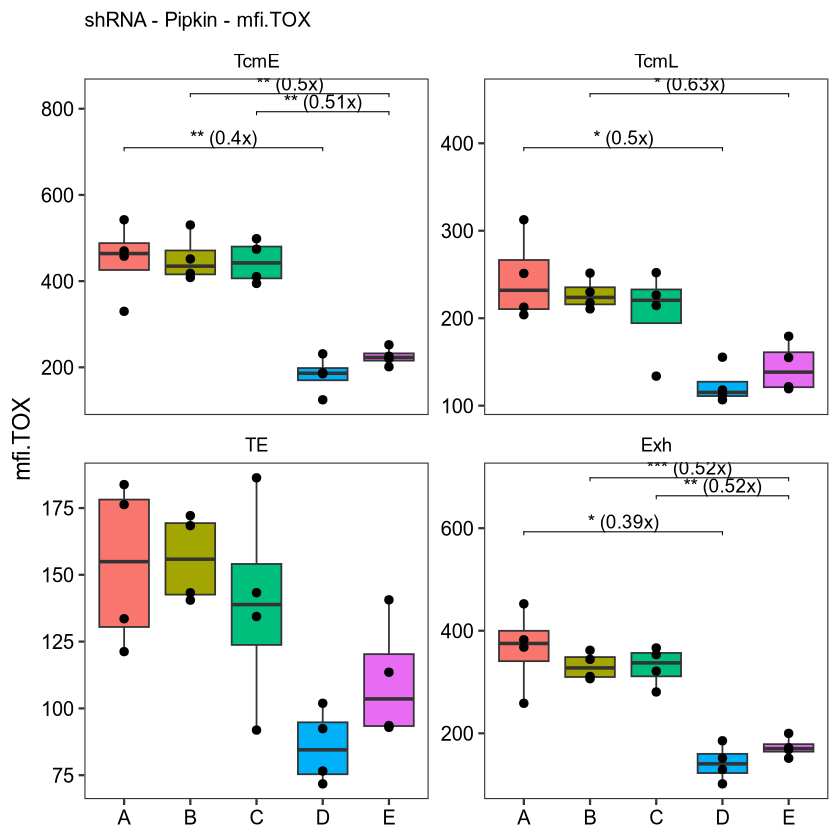

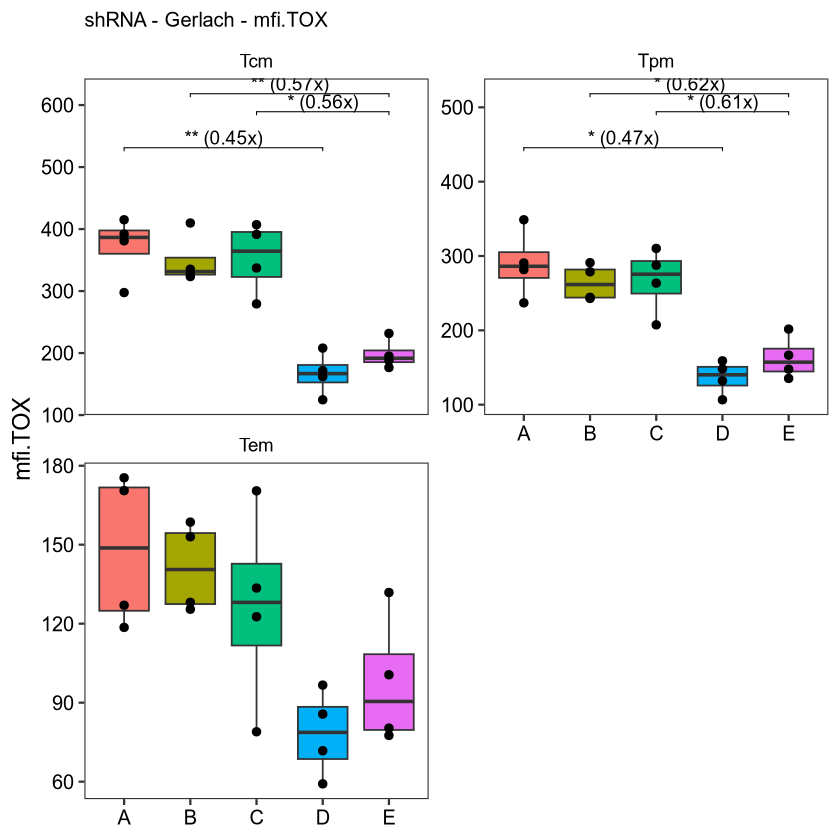

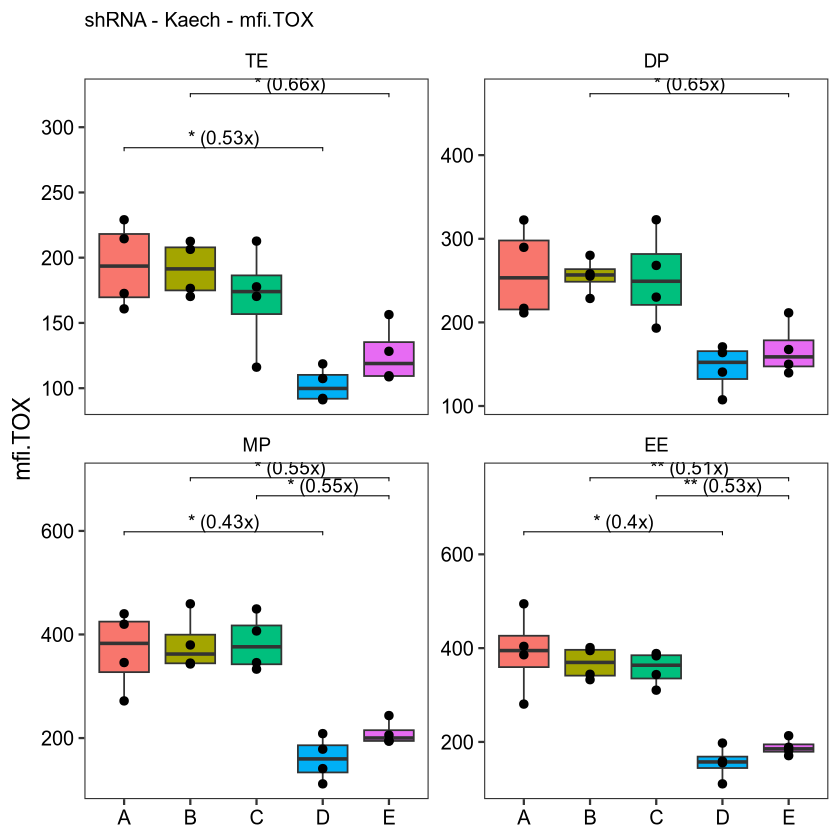

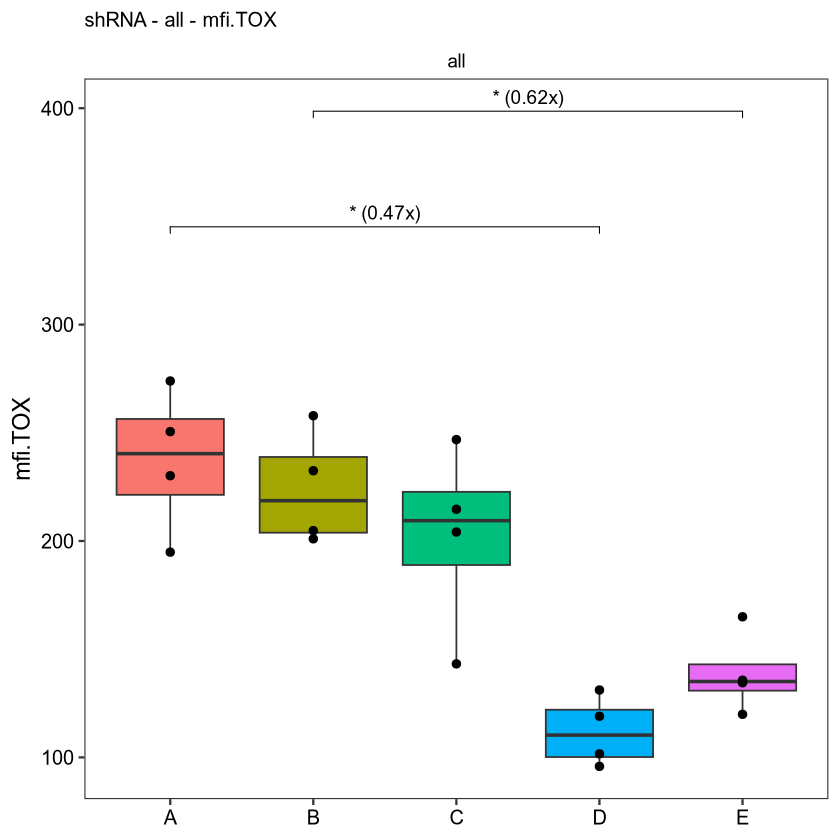

In [14]:
plotOnLoopPopulation(transductions, c(p.schemas, list(all = c("all"))), y_axis = "mfi.TOX", output_tag = "TOXmfi")

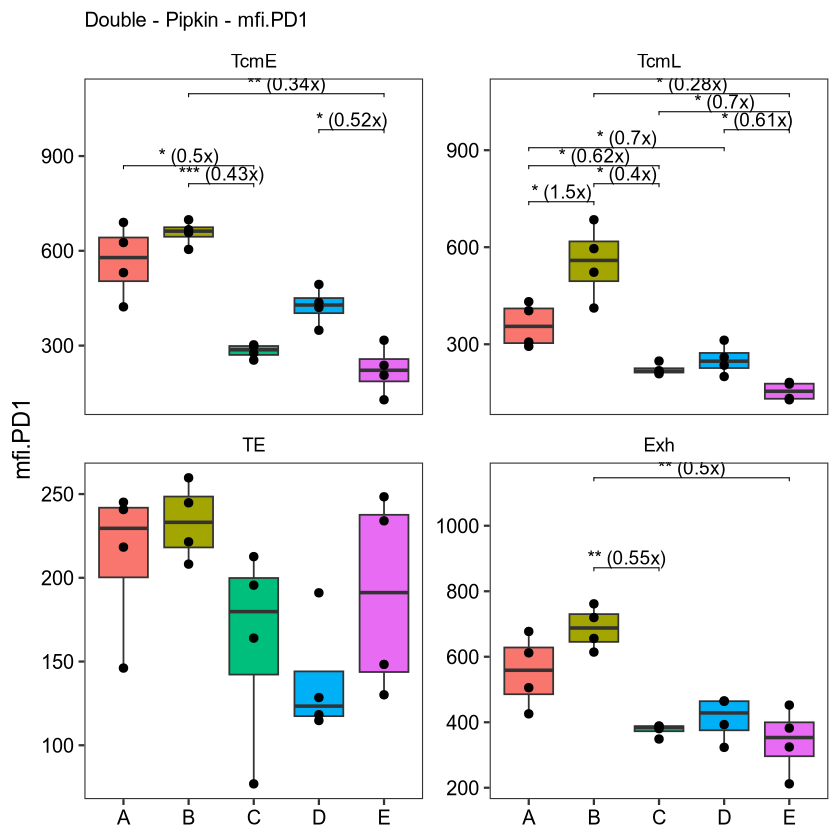

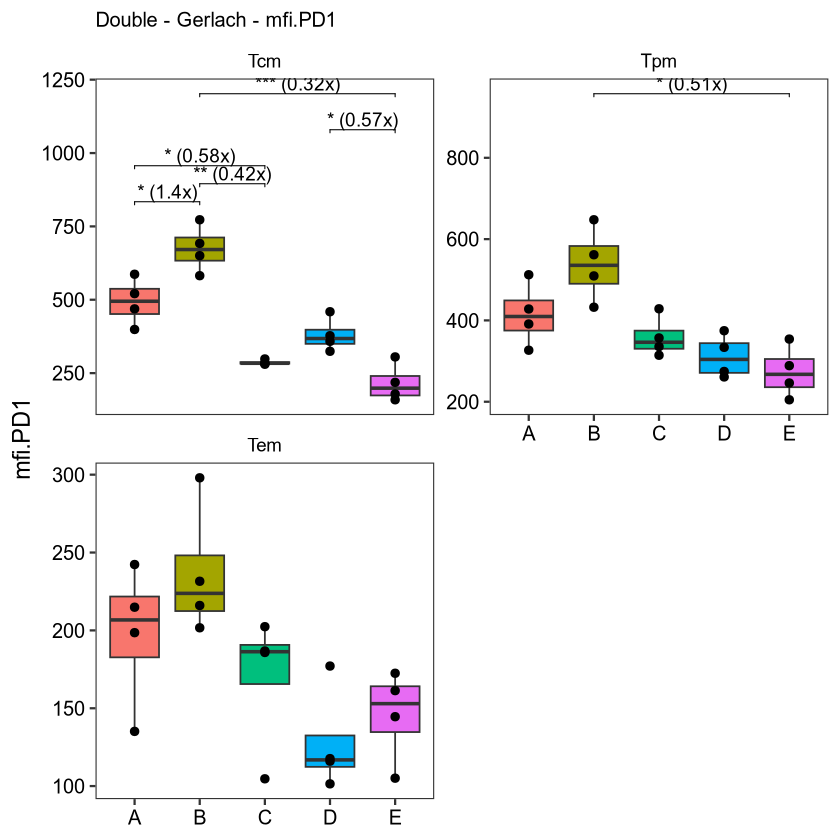

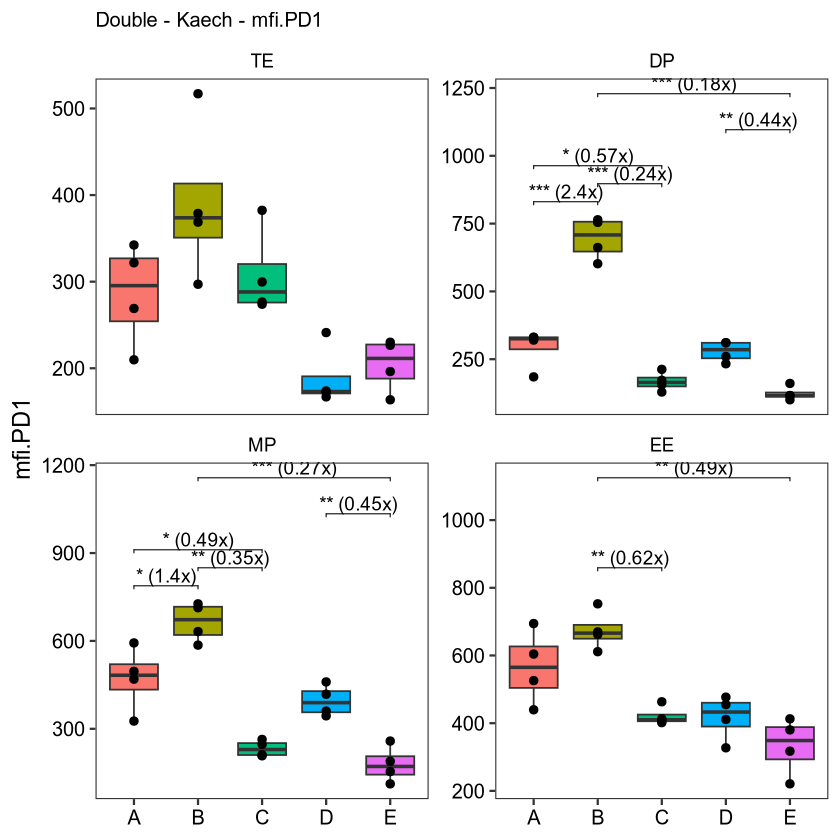

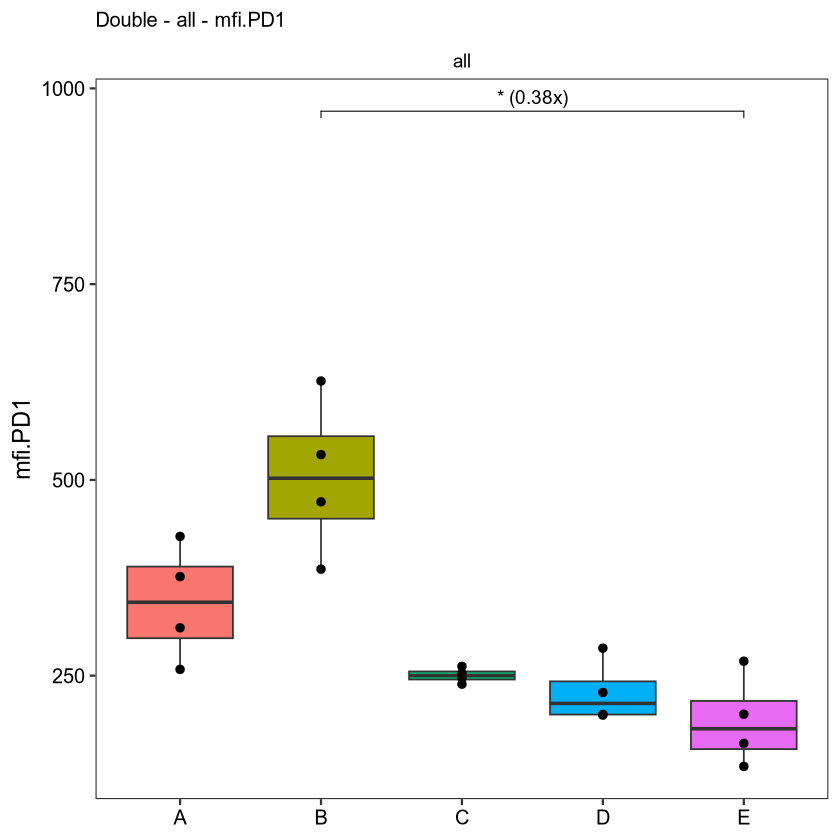

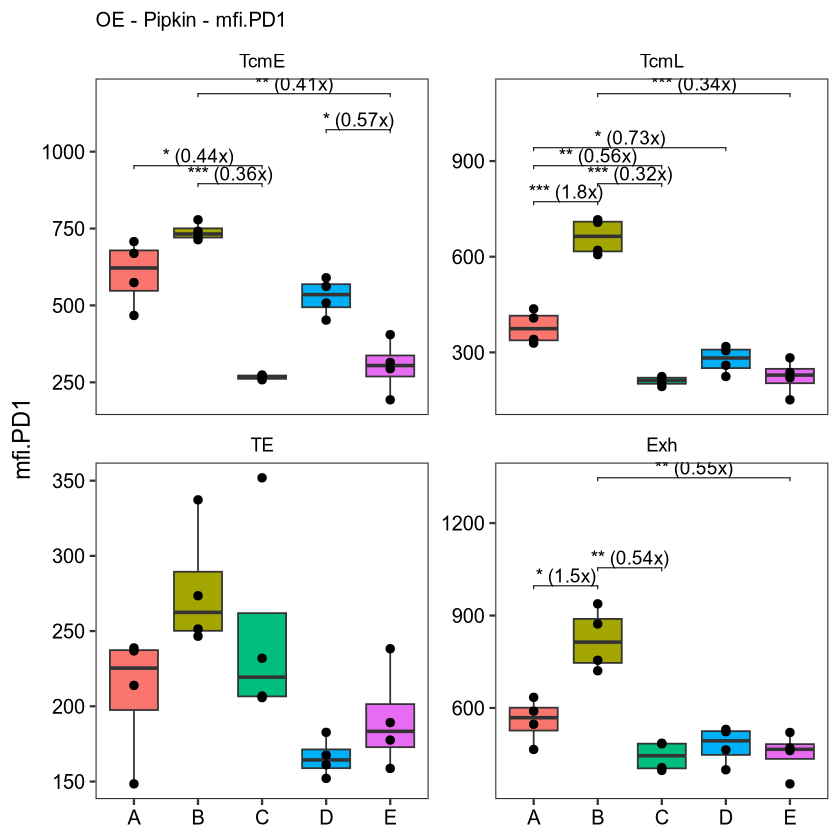

...

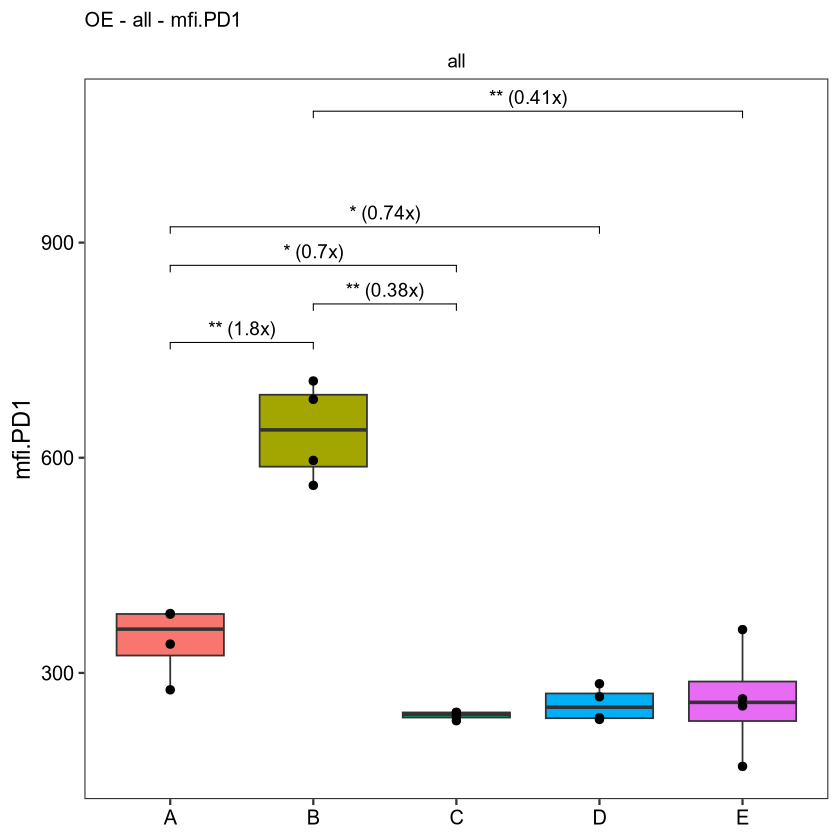

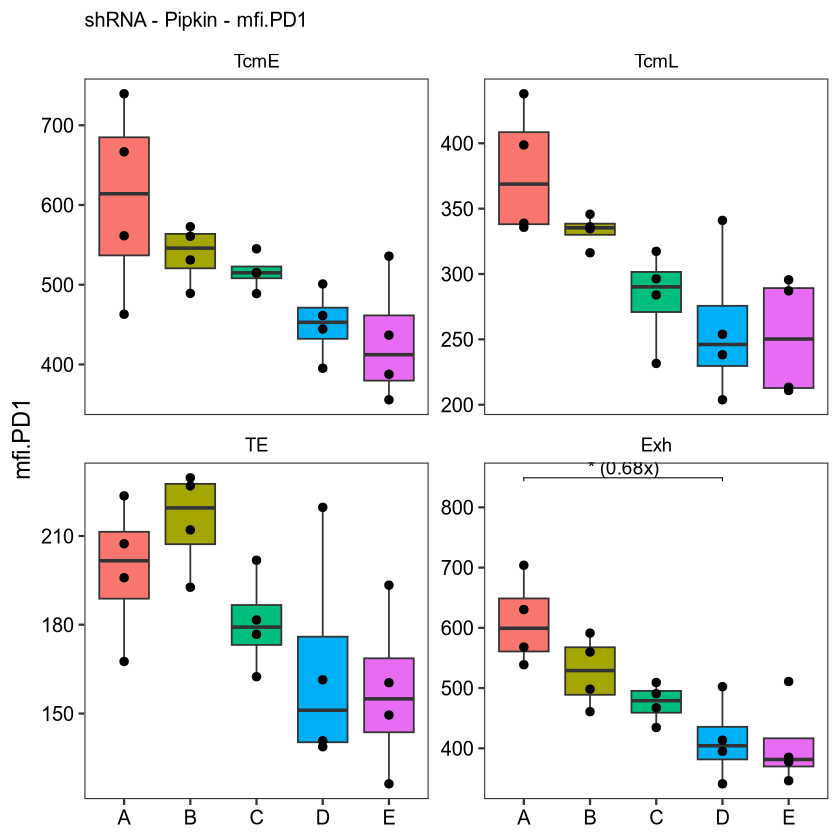

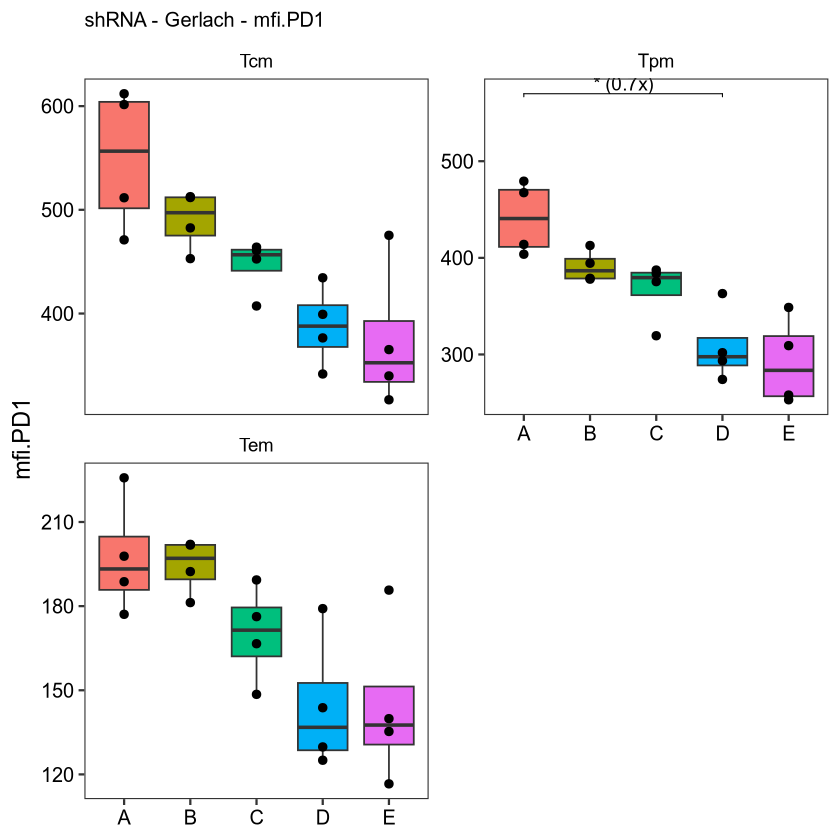

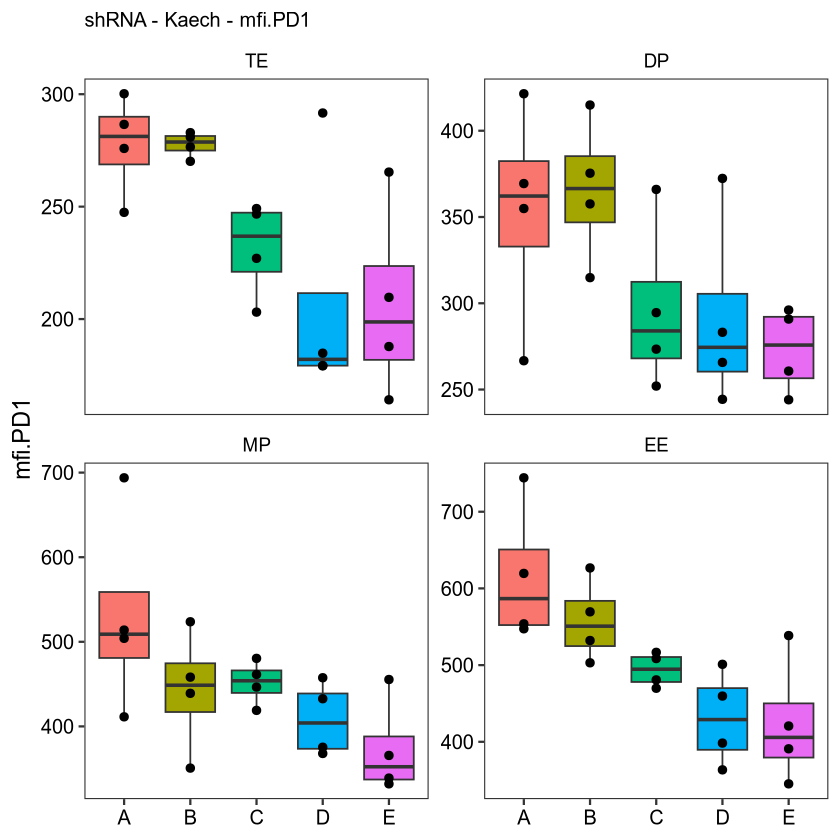

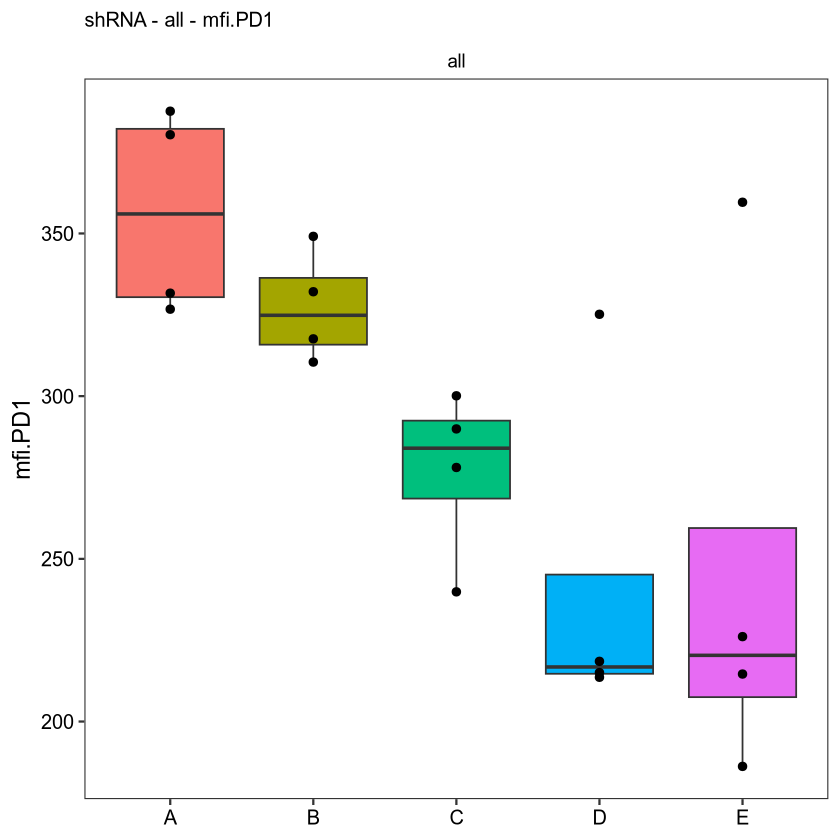

In [15]:
plotOnLoopPopulation(transductions, c(p.schemas, list(all = c("all"))), y_axis = "mfi.PD1", output_tag = "PD1mfi")